<a href="https://colab.research.google.com/github/ZackPashkin/search-through-videos/blob/master/SearchThroughVideos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# installation
!pip install flask==0.12.2
!pip install flask-ngrok
!pip install pytube
!pip install git+https://github.com/pandas-dev/pandas

In [1]:
# create dirs (flask needs static directory)
!mkdir /content/static
!mkdir /content/static/videos

# download video from youtube
from pytube import YouTube
import shutil
video = YouTube('https://www.youtube.com/watch?v=vTgBQvpTmyY')
video.streams.filter(file_extension = "mp4").all()
video.streams.get_by_itag(18).download()


mkdir: cannot create directory ‘/content/static’: File exists
mkdir: cannot create directory ‘/content/static/videos’: File exists


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated function all (This object can be treated as a list, all() is useless).
  if __name__ == '__main__':


'/content/Мастер и Маргарита  1 Серия.mp4'

In [10]:
# extract frames https://stackoverflow.com/a/63686021/9875025
!mkdir frames
import cv2

KPS = 0.1# Target Keyframes Per Second
VIDEO_PATH = "/content/Мастер и Маргарита  1 Серия.mp4"#"path/to/video/folder" # Change this
IMAGE_PATH = "frames/"#"path/to/image/folder" # ...and this 
EXTENSION = ".png"
cap = cv2.VideoCapture(VIDEO_PATH)
fps = round(cap.get(cv2.CAP_PROP_FPS))
print(fps)
# exit()
hop = round(fps / KPS)
curr_frame = 0
while(True):
    ret, frame = cap.read()
    if not ret: break
    if curr_frame % hop == 0:
            name = IMAGE_PATH + "_" + str(curr_frame) + EXTENSION
            cv2.imwrite(name, frame)
    curr_frame += 1
cap.release()


25


In [11]:
import os
print("number of frames: ", len(os.listdir("/content/frames"))

281

In [12]:
video.captions

{'a.ru': <Caption lang="Russian (auto-generated)" code="a.ru">}

In [17]:
# create df with timestamps and captions
import pandas as pd
caption = video.captions.get_by_language_code('a.ru')
print(caption.generate_srt_captions())
df = pd.read_xml(xml_str)
df.to_csv("captions_w_timestamps.csv",index=False)
df


,start,dur,text
0,30.10,13.769,[музыка]
1,46.71,82.520,[музыка]
2,125.47,3.760,[аплодисменты]
3,130.15,3.449,[музыка]
4,136.27,12.090,[музыка]
...,...,...,...
609,2697.17,10.400,[музыка]
610,2710.76,9.800,[музыка]
611,2722.72,8.440,[музыка]
612,2734.81,3.190,[музыка]


In [4]:
# shutil.copy2("/content/Мастер и Маргарита  1 Серия.mp4","/content/static/videos")

'/content/static/videos/Мастер и Маргарита  1 Серия.mp4'

# CLIP part make image embeddings

In [ ]:
!pip install git+https://github.com/openai/CLIP.git
!pip install ipyplot

In [1]:
import clip
clip.available_models()

['RN50', 'RN101', 'RN50x4', 'ViT-B/32']

In [2]:
from pathlib import Path
IMAGES_DIR = "/content/frames"
!mkdir /content/features/
FEATURES_DIR = "/content/features"

BATCH_SIZE = 512
photos_path = Path(IMAGES_DIR) 

# List all JPGs in the folder
photos_files = list(photos_path.glob("*.png"))

# Print some statistics
print(f"Photos found: {len(photos_files)}")

Photos found: 281


In [ ]:
import os
os.listdir(IMAGES_DIR)

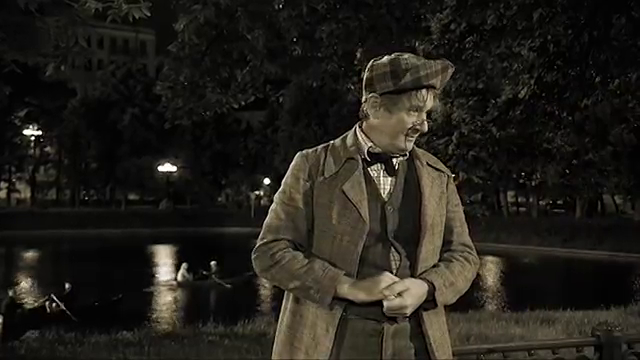

In [6]:
from PIL import Image
from glob import glob
Image.open(glob(IMAGES_DIR+"/*.png")[100])

In [7]:
import clip
import torch

from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import math
import numpy as np
import pandas as pd
import re
from glob import glob
import shutil
from tqdm.notebook import tqdm
from IPython.display import Image as Img
from IPython.display import  display
tqdm.pandas(desc="my bar!")

# Load the open CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)


100%|███████████████████████████████████████| 354M/354M [00:10<00:00, 35.3MiB/s]


In [8]:
# Function that computes the feature vectors for a batch of images
def compute_clip_features(photos_batch):
    # Load all the photos from the files
    photos = [Image.open(photo_file) for photo_file in photos_batch]
    
    # Preprocess all photos
    photos_preprocessed = torch.stack([preprocess(photo) for photo in photos]).to(device)

    with torch.no_grad():
        # Encode the photos batch to compute the feature vectors and normalize them
        photos_features = model.encode_image(photos_preprocessed)
        photos_features /= photos_features.norm(dim=-1, keepdim=True)

    # Transfer the feature vectors back to the CPU and convert to numpy
    return photos_features.cpu().numpy()




# Path where the feature vectors will be stored
features_path = Path(FEATURES_DIR) 

# Compute how many batches are needed
batches = math.ceil(len(photos_files) / BATCH_SIZE)
print(f"Total batches number: {batches}")


for i in tqdm(range(batches)):
    batch_ids_path = features_path / f"{i:010d}.csv"
    batch_features_path  = features_path / f"{i:010d}.npy"

    if not batch_features_path.exists():
        try:
            # print(i, [photo_file for photo_file in batch_files])
            batch_files = photos_files[i*BATCH_SIZE: min(len(photos_files), (i+1)*BATCH_SIZE)]
            batch_features = compute_clip_features(batch_files)
            np.save(batch_features_path, batch_features)
            photo_ids = [photo_file.name.split(".")[0] for photo_file in batch_files]
            photo_ids_data = pd.DataFrame(photo_ids, columns=['photo_id'])
            photo_ids_data.to_csv(batch_ids_path, index=False)
        except:
            # Catch problems with the processing to make the process more robust
            print(f'Problem with batch {i}')




features_list = [np.load(feature_file) for feature_file in sorted(features_path.glob('*.npy'))]
features = np.concatenate(features_list)
np.save(features_path/f"features.npy", features)
photo_ids = pd.concat([pd.read_csv(ids_file) for ids_file in sorted(features_path.glob('*.csv'))])





Total batches number: 1


In [ ]:
def add_path(idx):
  return f'{IMAGES_DIR}/{idx}.png'
photo_ids = photo_ids["photo_id"].apply(add_path)

photo_ids.to_csv(features_path / f"photo_ids.csv", index=False)

In [10]:
# to allow search by image
def compute_input_img_features(input_img_path):
    img = Image.open(input_img_path)#.convert('RGB')
    photo_preprocessed = torch.stack([preprocess(img)]).to(device)

    with torch.no_grad():
        # Encode the photos batch to compute the feature vectors and normalize them
        photo_features = model.encode_image(photo_preprocessed)
        photo_features /= photo_features.norm(dim=-1, keepdim=True)

    # Transfer the feature vectors back to the CPU and convert to numpy
    return photo_features.cpu().numpy()

input_img_path = glob(IMAGES_DIR+"/*.png")[100]
img_features = compute_input_img_features(input_img_path)
img_features.shape

(1, 512)

In [13]:
def encode_search_query(search_query):
  with torch.no_grad():
    # Encode and normalize the search query using CLIP
    text_encoded = model.encode_text(clip.tokenize(search_query).to(device))
    text_encoded /= text_encoded.norm(dim=-1, keepdim=True)

  # Retrieve the feature vector from the GPU and convert it to a numpy array
  return text_encoded.cpu().numpy()

text_features = encode_search_query(search_query="")
text_features.shape

(1, 512)

In [14]:
# MODIFIED CLIP SEARCH

def find_best_matches_mod(img_features, photo_features, photo_ids, results_count=3):
  # Compute the similarity between the search query and each photo using the Cosine similarity
  similarities = (photo_features @ img_features.T).squeeze(1)

  # Sort the photos by their similarity score
  best_photo_idx = np.argsort(similarities)[::-1]

  # Return the photo IDs of the best matches
  return [photo_ids[i] for i in best_photo_idx[:results_count]]


def display_photo(photo_id):
  display(Img(photo_id))
  


def search_with_clip_mod(input_img_path, photo_features, photo_ids, results_count=3):
  # Encode the search query
  img_features = compute_input_img_features(input_img_path)

  # Find the best matches
  best_photo_ids = find_best_matches_mod(img_features, photo_features, photo_ids, results_count)
  print(best_photo_ids)
  # Display the best photos
  for photo_id in best_photo_ids:   
    display_photo(photo_id) 
  return best_photo_ids





In [ ]:
# !mkdir /content/features

In [15]:
# to allow search via text prompt
def encode_search_query(search_query):
  with torch.no_grad():
    # Encode and normalize the search query using CLIP
    text_encoded = model.encode_text(clip.tokenize(search_query).to(device))
    text_encoded /= text_encoded.norm(dim=-1, keepdim=True)

  # Retrieve the feature vector from the GPU and convert it to a numpy array
  return text_encoded.cpu().numpy()

def find_best_matches(text_features, photo_features, photo_ids, results_count=3):
  # Compute the similarity between the search query and each photo using the Cosine similarity
  similarities = (photo_features @ text_features.T).squeeze(1)

  # Sort the photos by their similarity score
  best_photo_idx = np.argsort(similarities)[::-1]

  # Return the photo IDs of the best matches
  return [photo_ids[i] for i in best_photo_idx[:results_count]]


def display_photo(photo_id):
  display(Img(photo_id))
  


def search_with_clip(search_query, photo_features, photo_ids, results_count=3):
  # Encode the search query
  text_features = encode_search_query(search_query)

  # Find the best matches
  best_photo_ids = find_best_matches(text_features, photo_features, photo_ids, results_count)
  print(best_photo_ids)
  # Display the best photos
  for photo_id in best_photo_ids:   
    display_photo(photo_id) 
  return best_photo_ids

## search through videos

In [16]:
FEATURES_DIR  = "/content/features"

In [17]:
# load the img idx
photo_ids = list(pd.read_csv(f"{FEATURES_DIR}/photo_ids.csv")['photo_id'])
# load the features vectors
photo_features = np.load(f"{FEATURES_DIR}/features.npy")


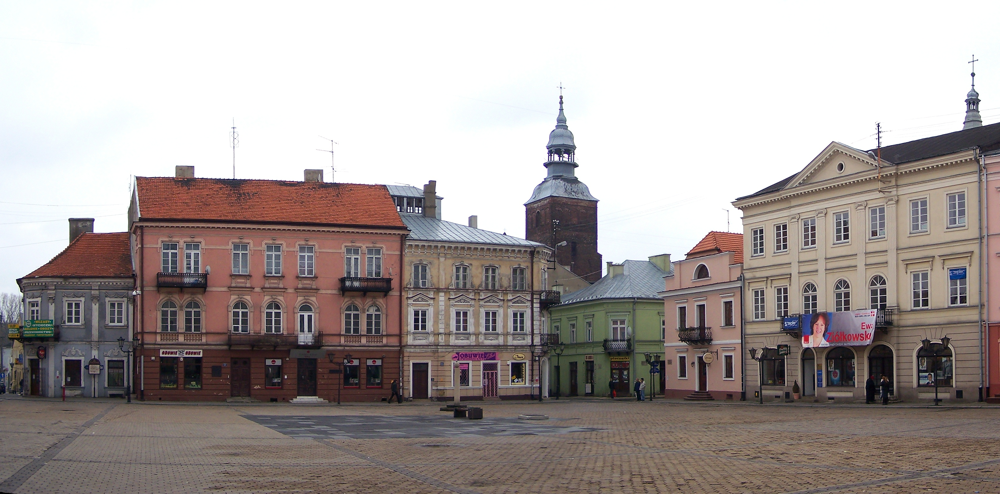

In [31]:
# input_img_path = glob(IMAGES_DIR+"/*.png")[100]
input_img_path = "/content/Piotrków_Trybunalski_-_Rynek.jpg"
image = Image.open(input_img_path)
image


Input image
Result
['/content/frames/_59750.png', '/content/frames/_68500.png']


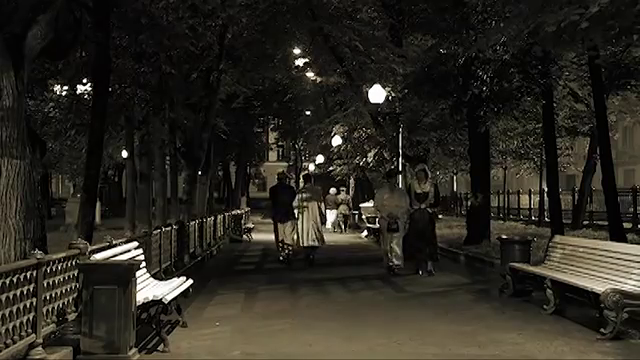

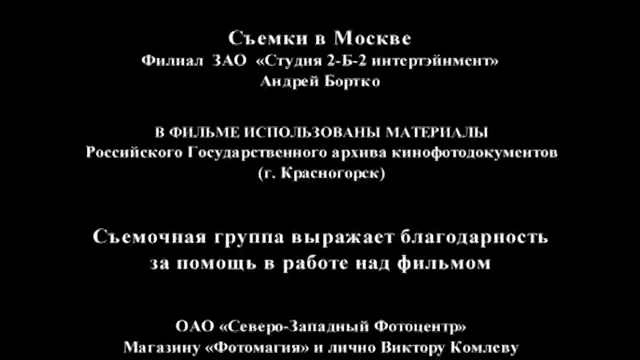

In [32]:

# input_img_path = input_img_path

print("Input image")
print("Result")
best_photo_ids = search_with_clip_mod(input_img_path, photo_features, photo_ids, results_count=2)

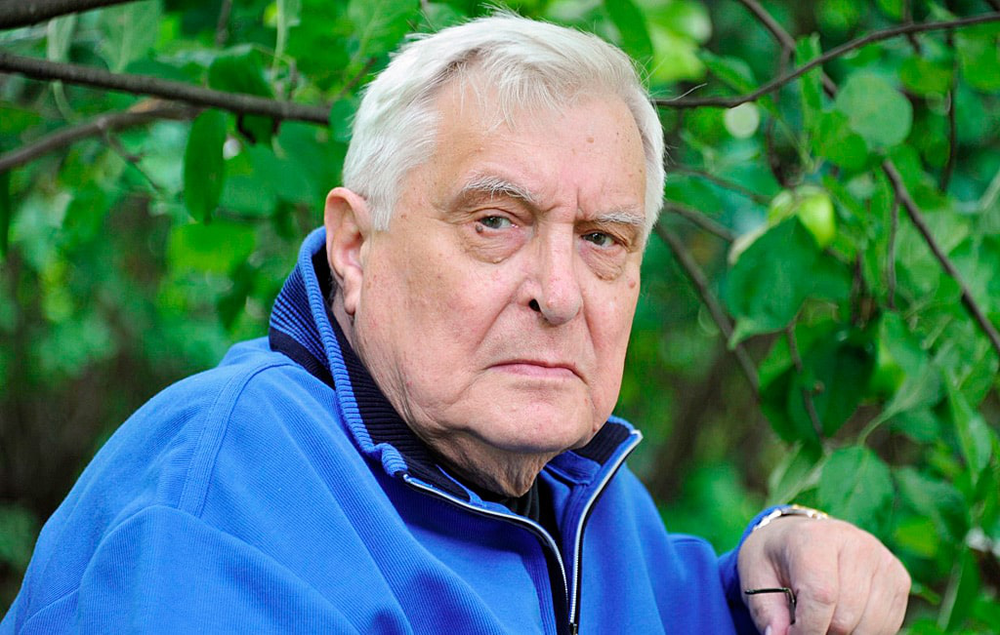

In [40]:
# input_img_path = glob(IMAGES_DIR+"/*.png")[100]
input_img_path = "/content/oleg-basilashvili.jpg"
image = Image.open(input_img_path)
image



Input image
Result
['/content/frames/_15250.png', '/content/frames/_17250.png']


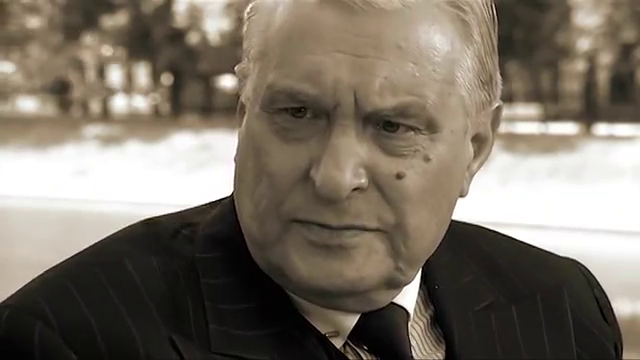

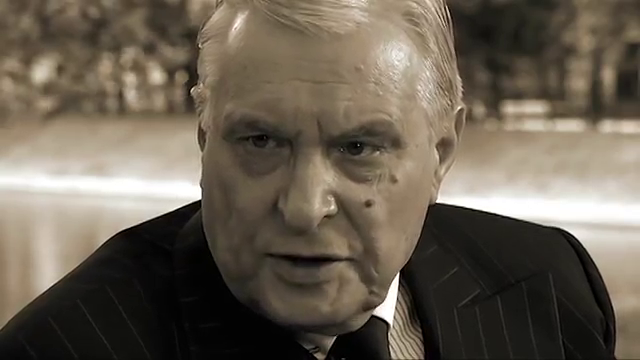

In [41]:

# input_img_path = input_img_path

print("Input image")
print("Result")
best_photo_ids = search_with_clip_mod(input_img_path, photo_features, photo_ids, results_count=2)

a photo of Oleg Basilashvili
['/content/frames/_6750.png', '/content/frames/_2250.png', '/content/frames/_15500.png']


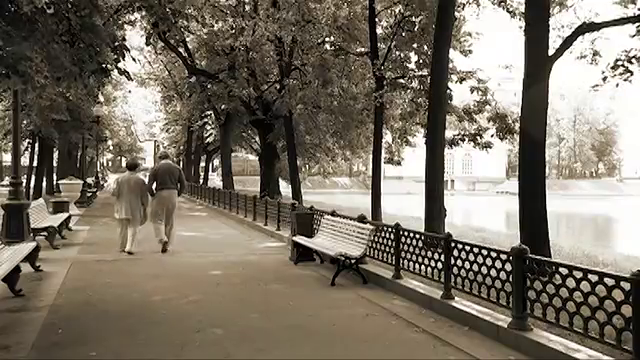

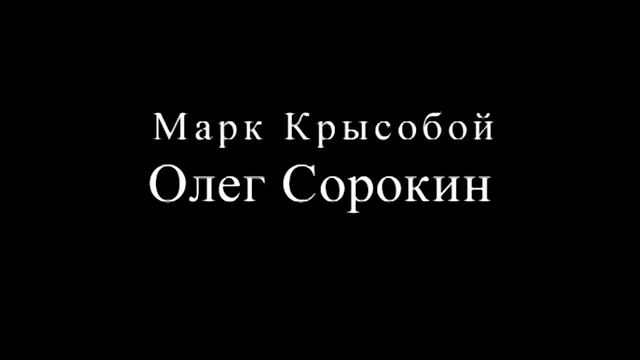

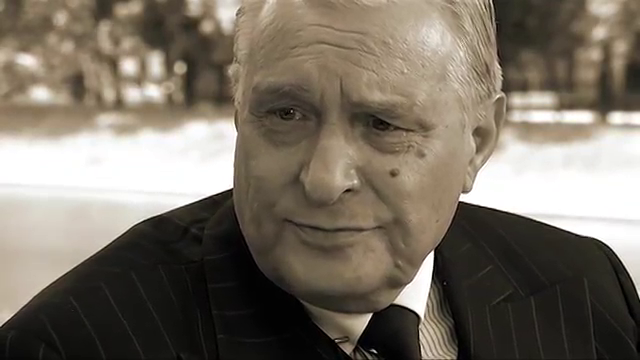

In [39]:
search_query_list = ["a photo of Oleg Basilashvili","a photo of Jesus", 'a photo of a rom imperor', 'a photo with letters Q.R.']
search_query = search_query_list[0]
print(search_query)
best_photo_ids = search_with_clip(search_query, photo_features, photo_ids, 3)


a photo of a rom imperor
['/content/frames/_43250.png', '/content/frames/_33500.png', '/content/frames/_42500.png']


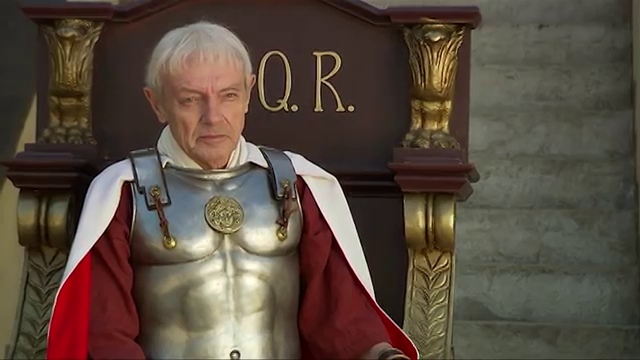

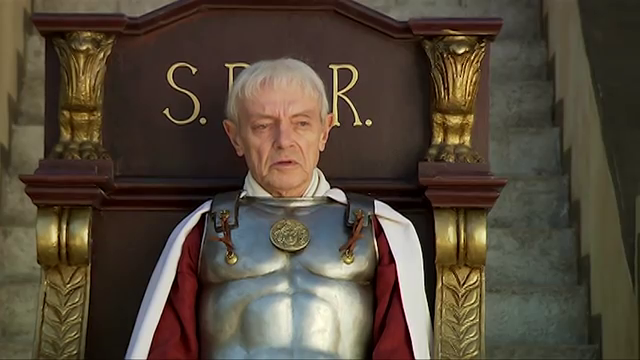

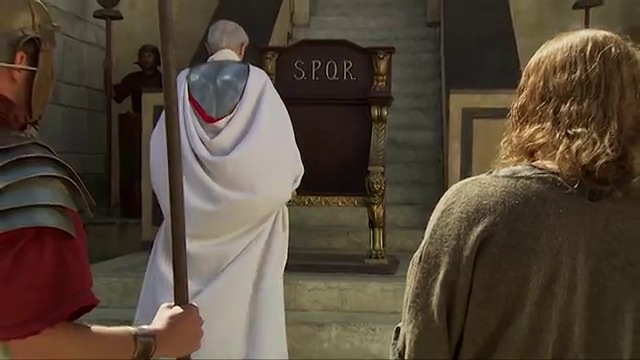

In [30]:
search_query_list = ["a photo of Jesus", 'a photo of a rom imperor', 'a photo with letters Q.R.']
search_query = search_query_list[1]
print(search_query)
best_photo_ids = search_with_clip(search_query, photo_features, photo_ids, 3)


a photo with letters Q.R.
['/content/frames/_2250.png', '/content/frames/_58250.png', '/content/frames/_2000.png']


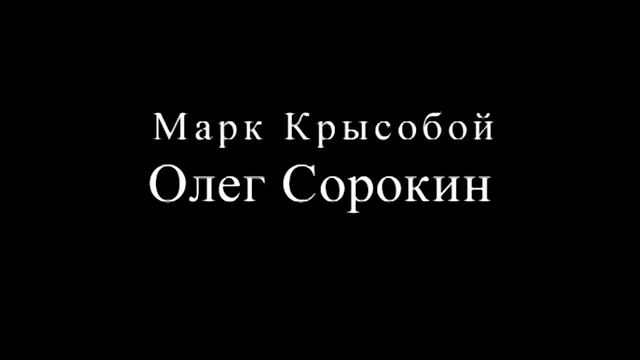

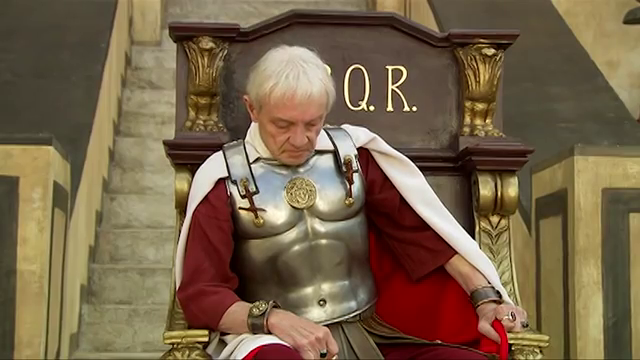

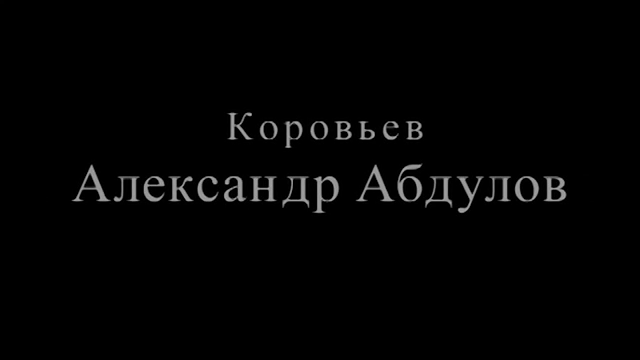

In [29]:

search_query_list = ["a photo of Jesus", 'a photo of a rom imperor', 'a photo with letters Q.R.']


a photo of a Jesus
['/content/frames/_33750.png', '/content/frames/_46750.png', '/content/frames/_32500.png']


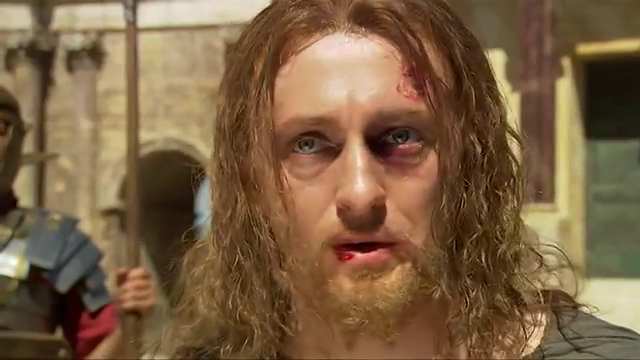

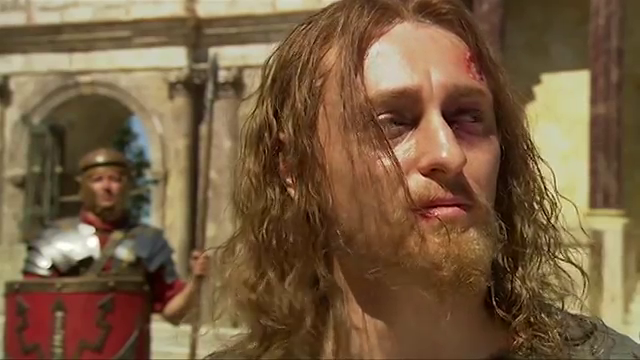

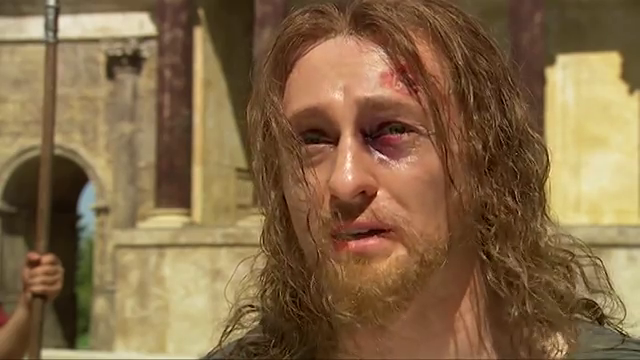

In [27]:
# rank images from gan
search_query_list = ["a photo of Jesus"]
search_query = search_query_list[0]
print(search_query)
best_photo_ids = search_with_clip(search_query, photo_features, photo_ids, 3)


a photo of place where they sit and talk
['/content/frames/_64750.png', '/content/frames/_9750.png', '/content/frames/_10250.png']


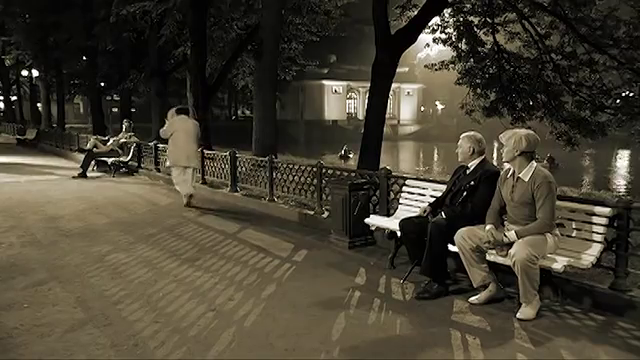

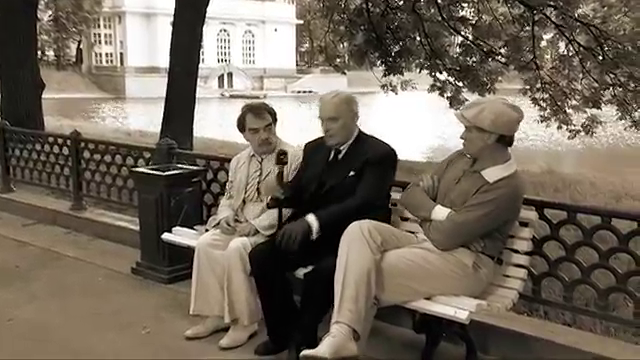

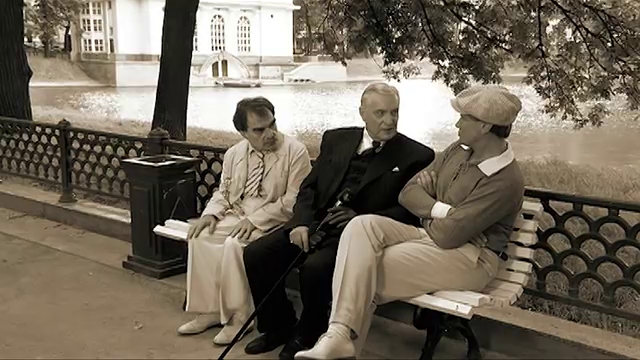

In [42]:
search_query_list = ["a photo of place where they sit and talk", 'a photo of a rom imperor', 'a photo with letters Q.R.']
search_query = search_query_list[0]
print(search_query)
best_photo_ids = search_with_clip(search_query, photo_features, photo_ids, 3)

## Basic flask app

In [ ]:
!mkdir templates
%cd /content/templates

html = """
<!DOCTYPE html> 
<html> 
<body> 

<video width="400" controls>
  <source src="{{video}}" type="video/mp4">

</video>

<p>
Video courtesy of 
<a href="https://www.youtube.com/watch?v=WTuC8vg3m_w" target="_blank">NEW Super Mario Bloopers 4</a>.
</p>

</body> 
</html>

"""

with open("index.html","a+") as f:
  f.write(html)

%cd /content

In [ ]:
from flask_ngrok import run_with_ngrok
from flask import Flask,render_template
import os
from glob import glob

VIDEO_FOLDER = os.path.join('static', 'videos')

app = Flask(__name__)

#starts ngrok when the app is run
run_with_ngrok(app)   
video = glob(VIDEO_FOLDER+"/*.mp4")[0]



@app.route("/")
def home():
    return render_template("index.html", video = video)
app.run()